[SETUP] Creating Frozen Lake environment...
[ENV] Action Space: Discrete(4)
[ENV] Observation Space: Discrete(16)
[ENV] Description:
SFFF
FHFH
FFFH
HFFG

[AGENT] Initialized Q-Table with shape: (16, 4) (States x Actions)
[AGENT] Starting training for 20000 episodes...



100%|██████████| 20000/20000 [00:06<00:00, 2882.42it/s]



[RESULTS] Training complete!
Final Exploration Rate (epsilon): 0.0500
Success Rate (last 1000 episodes): 93.50%

Trained Q-Table (first few states):
State | Left     Down     Right    Up   | Best Action
------|---------------------------------|------------
   0  | 0.9415 0.9510 0.9510 0.9415 | 1
   1  | 0.9415 -0.1000 0.9606 0.9510 | 2
   2  | 0.9510 0.9703 0.9510 0.9606 | 1
   3  | 0.9606 -0.1000 0.9510 0.9510 | 0
   4  | 0.9510 0.9606 -0.1000 0.9415 | 1
   5  | 0.0000 0.0000 0.0000 0.0000 | 0
   6  | -0.1000 0.9801 -0.1000 0.9606 | 1
   7  | 0.0000 0.0000 0.0000 0.0000 | 0
Policy Grid:
↓ → ↓ ← 
↓ H ↓ H 
→ ↓ ↓ H 
H → → G 


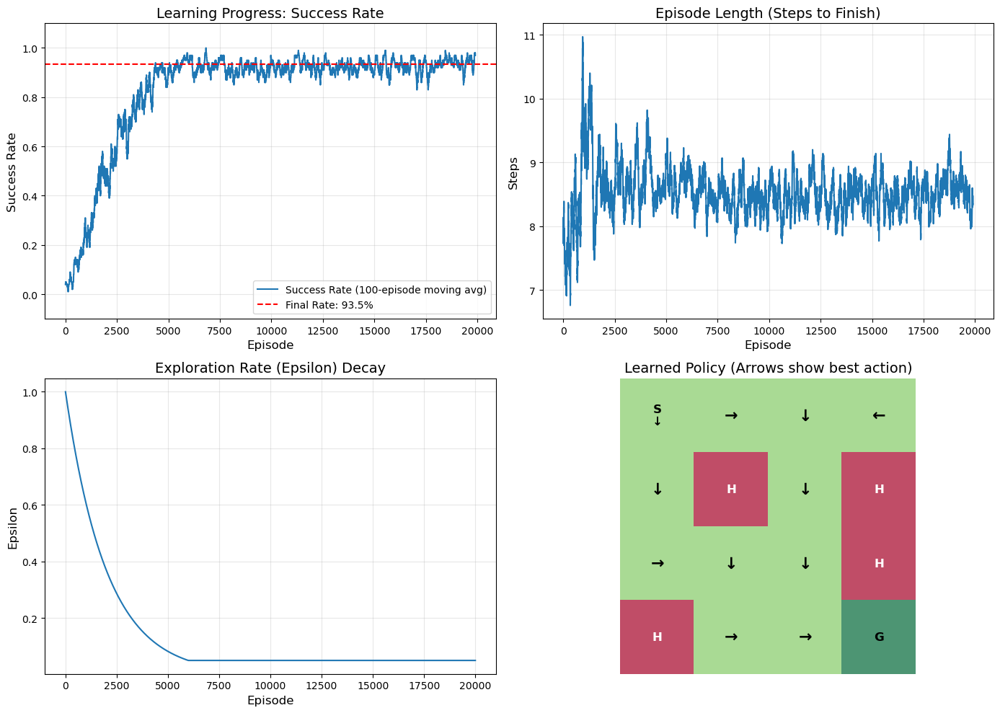

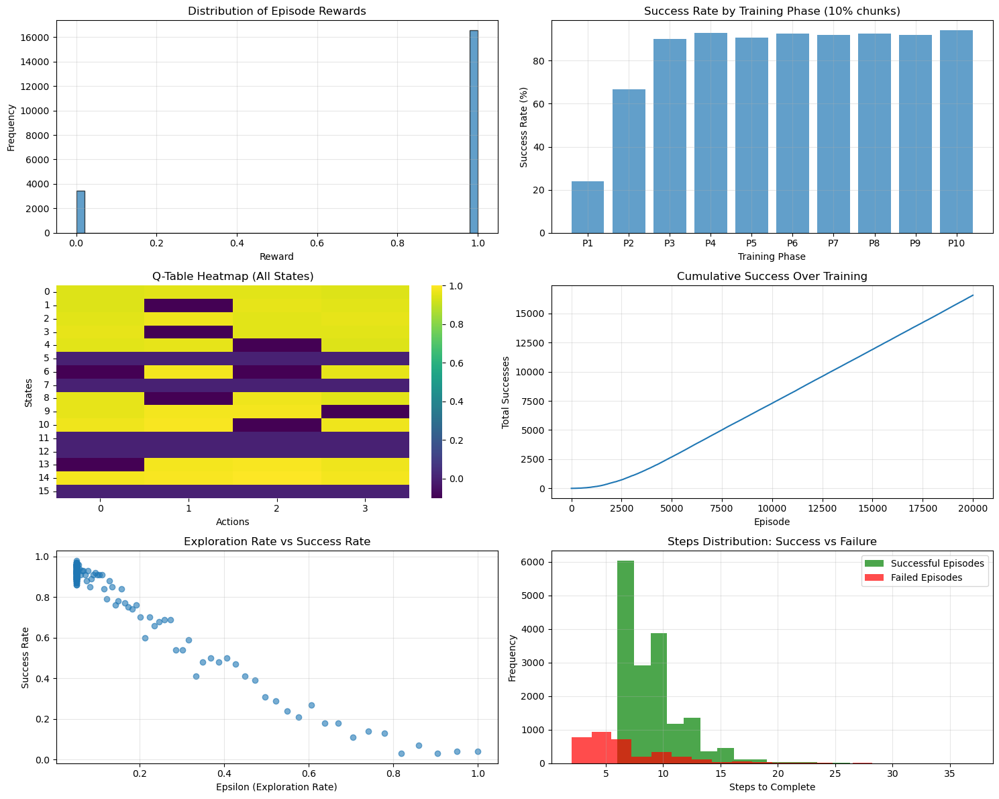


[DEMO] Showing 5 episodes with learned policy (epsilon=0)...
Demo Episode 1:


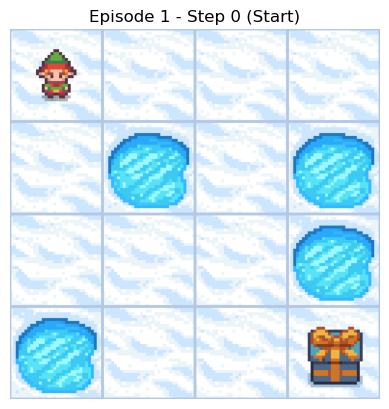

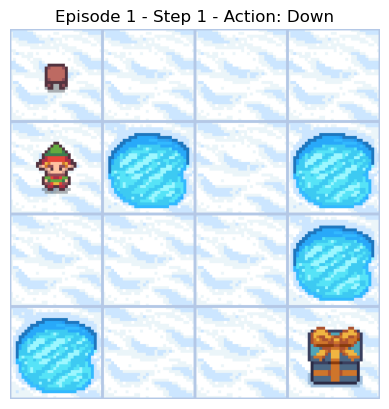

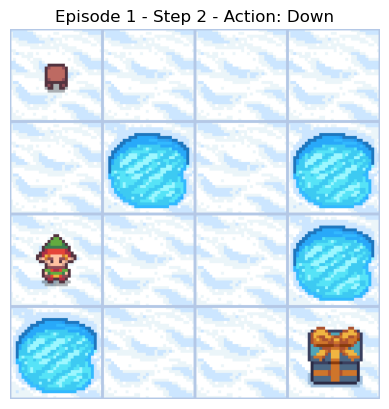

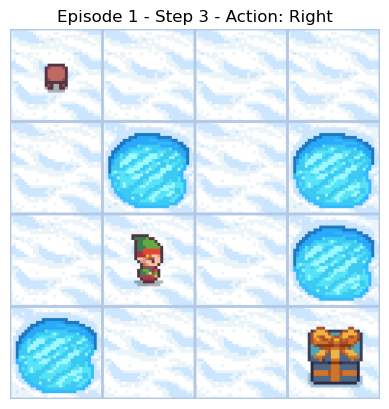

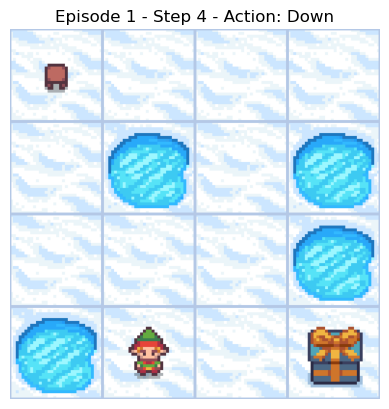

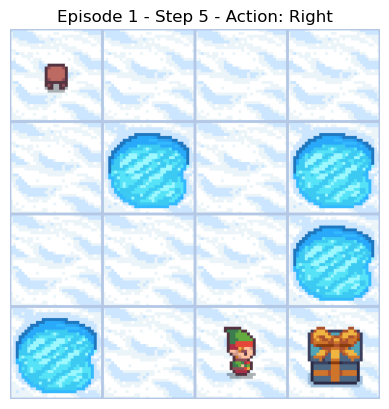

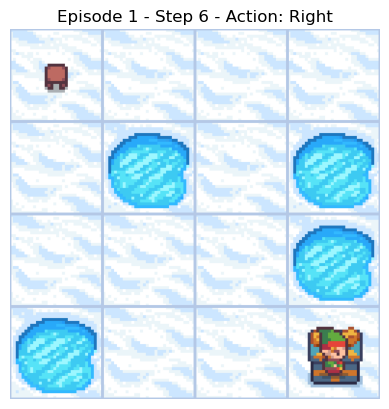

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 6


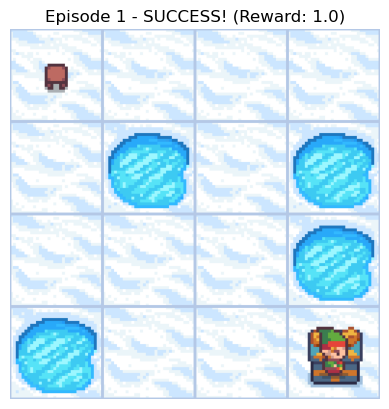

Demo Episode 2:


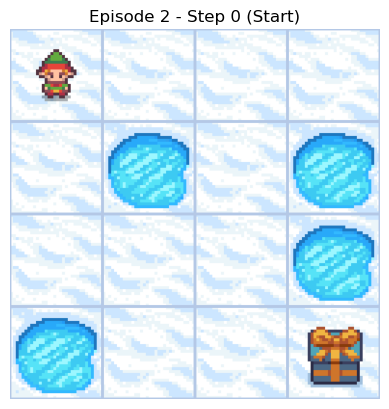

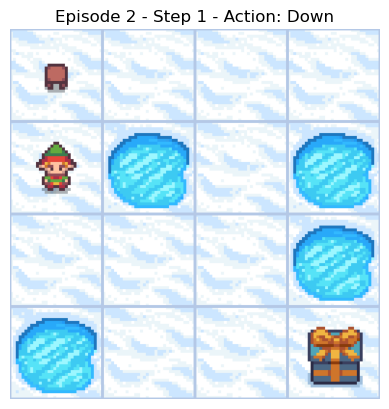

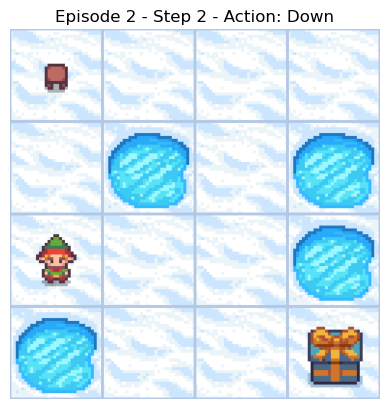

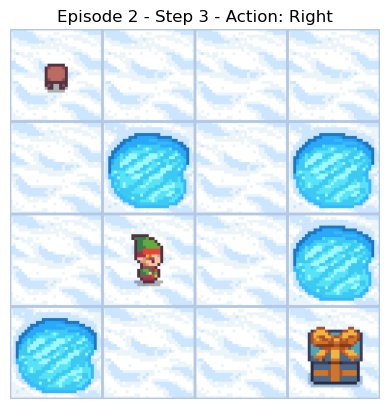

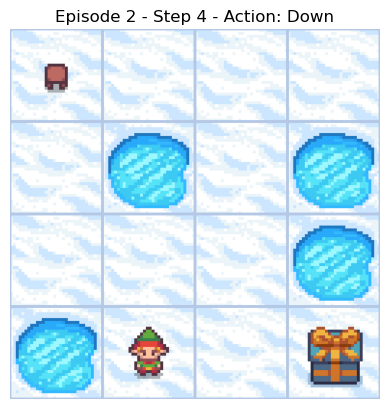

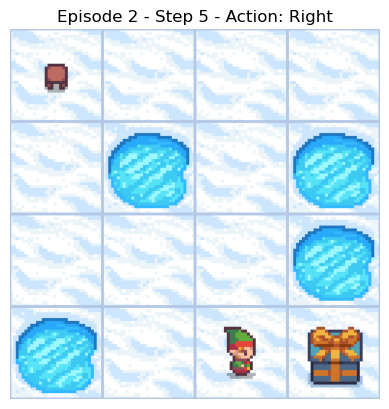

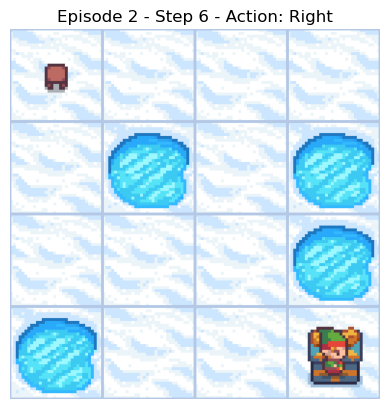

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 6


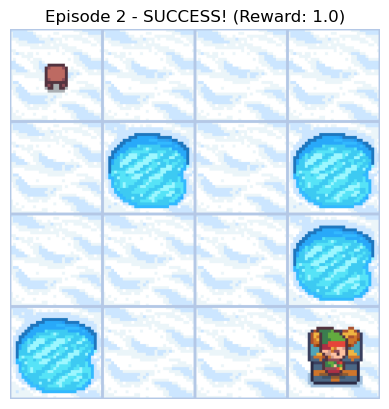

Demo Episode 3:


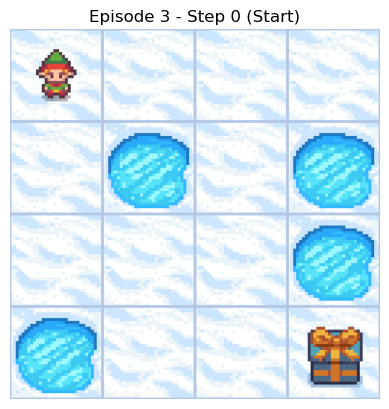

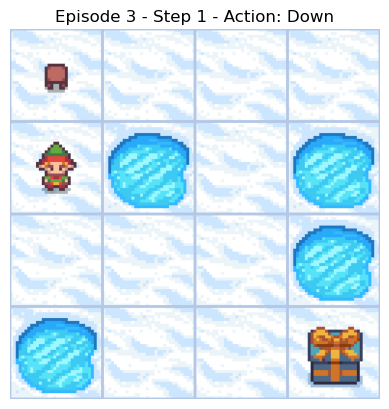

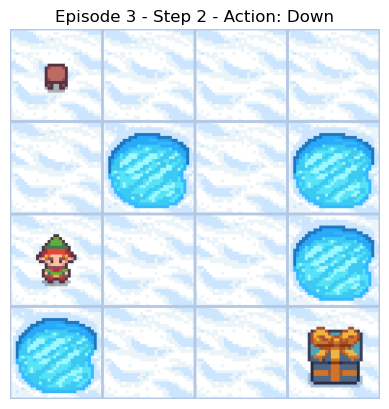

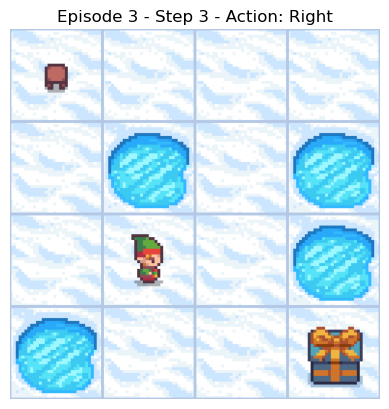

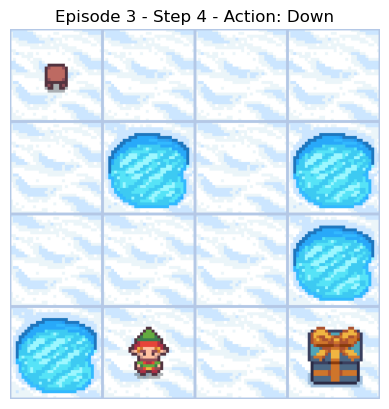

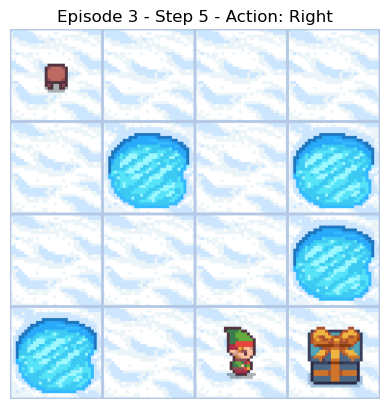

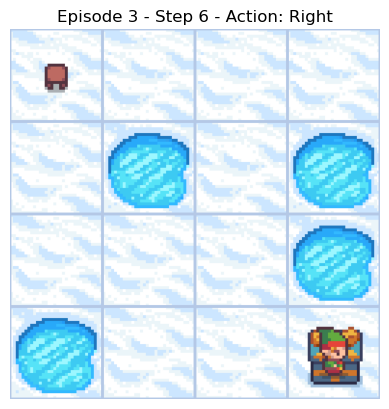

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 6


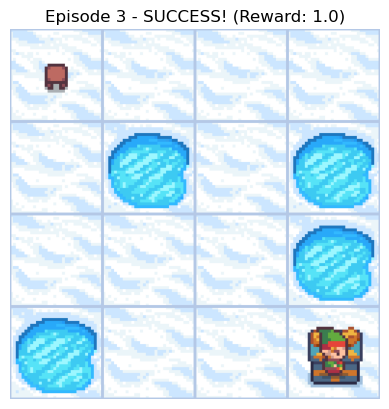

Demo Episode 4:


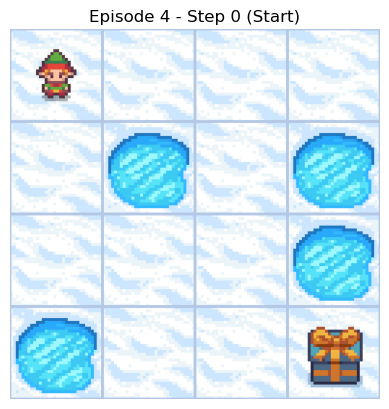

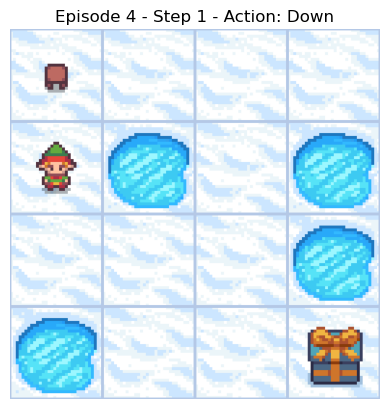

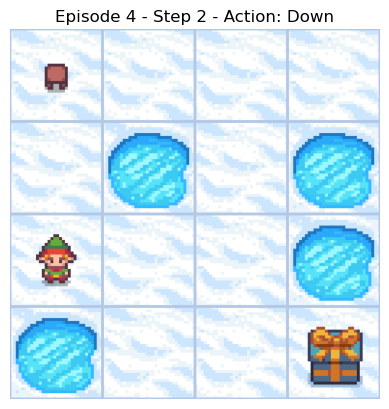

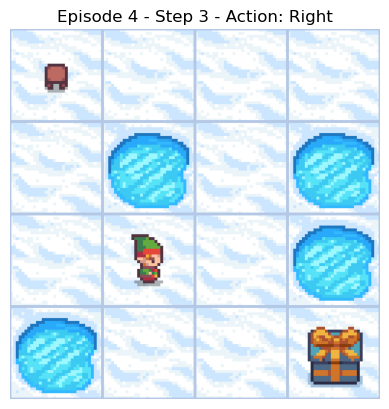

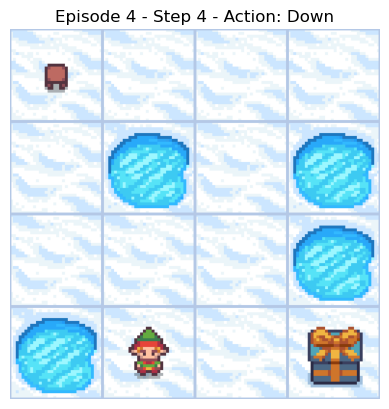

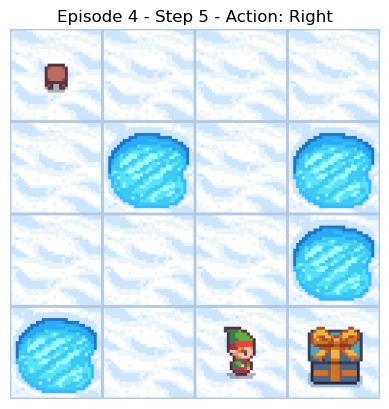

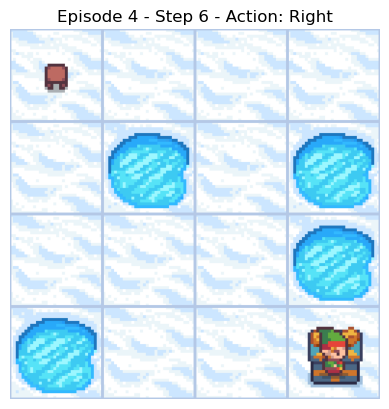

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 6


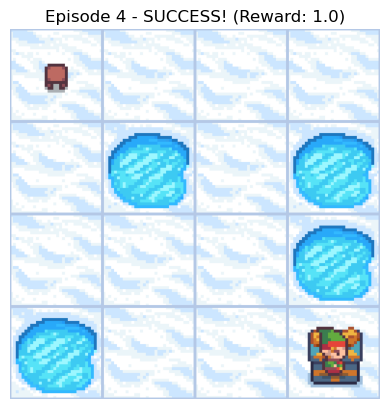

Demo Episode 5:


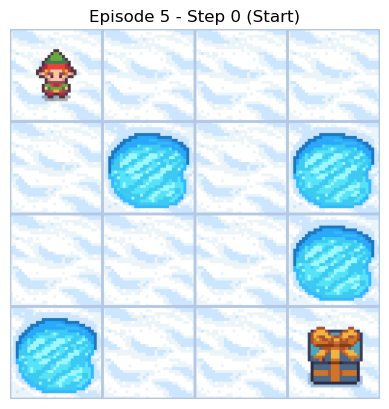

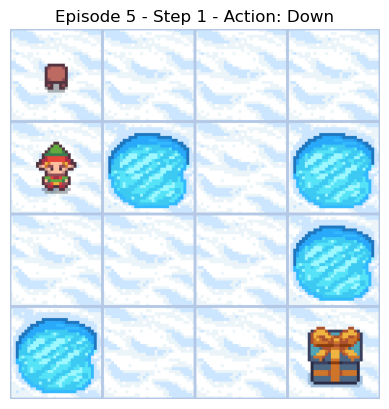

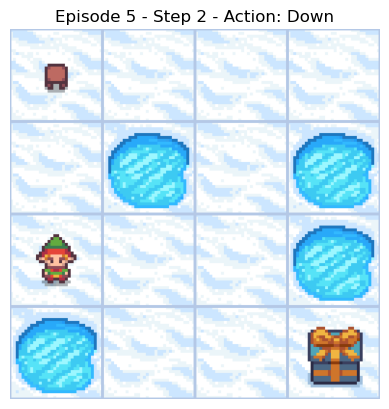

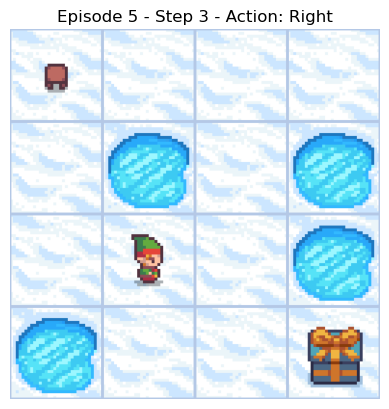

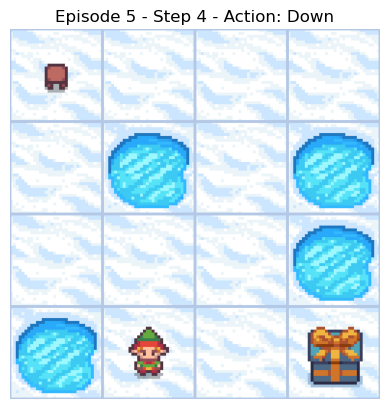

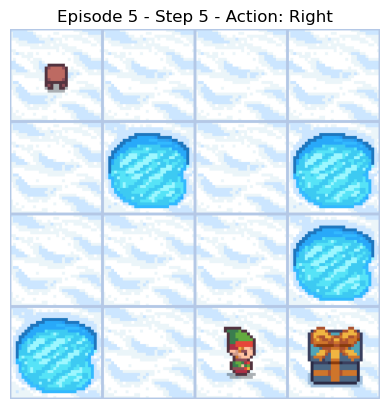

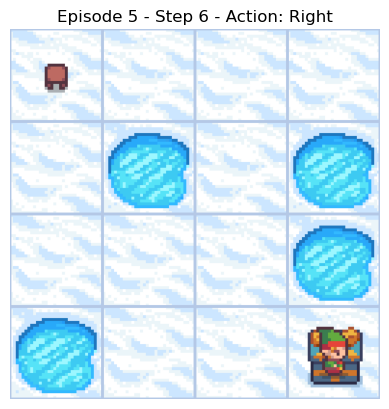

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 6


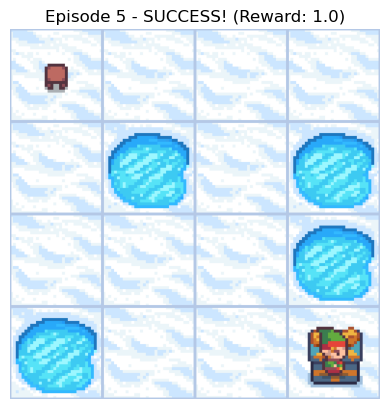


Demo complete!

[ANALYSIS] Q-Table Statistics:
Maximum Q-value: 1.0000
Minimum Q-value: -0.1000
Average Q-value: 0.5133

[POLICY] Complete Learned Policy:
(S=Start, F=Frozen, H=Hole, G=Goal)
Arrows show the best action to take in each cell:

↓ → ↓ ← 
↓ H ↓ H 
→ ↓ ↓ H 
H → → G 


In [ ]:
# frozen_lake.py
# Reinforcement Learning Mini-Project: Frozen Lake
# Algorithm: Q-Learning

import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  

# --- PART 1: SETUP THE ENVIRONMENT ---
print("[SETUP] Creating Frozen Lake environment...")
# 'is_slippery=False' makes the environment deterministic (easier to learn for beginners)
env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')
env.reset()

# Let's see what the environment looks like
print(f"[ENV] Action Space: {env.action_space}")   # 0:Left, 1:Down, 2:Right, 3:Up
print(f"[ENV] Observation Space: {env.observation_space}") # 0 to 15, representing each grid cell
print("[ENV] Description:")
for row in env.unwrapped.desc:
    print("".join([cell.decode('utf-8') for cell in row]))
print("")

# --- PART 2: UNDERSTAND THE PROBLEM ---
# The agent starts at S. It must reach G without falling into H.
# Rewards: +1 for reaching G, 0 otherwise (even for falling in a hole!).
# This means the agent must learn that holes are bad because they end the episode with no reward.

# --- PART 3: SETUP THE Q-LEARNING AGENT ---

# Hyperparameters - These are the knobs we can tune to make learning better/worse
# learning_rate = 0.8   # How much we update our Q-values with new info (0 to 1)
# gamma = 0.95          # Discount factor: how much we care about future rewards (0 to 1)
# epsilon = 1.0         # Starting exploration rate (100% random at first)
# epsilon_min = 0.01    # Minimum exploration rate (we never stop exploring completely)
# epsilon_decay = 0.999 # How fast we reduce exploration after each episode

# OPTIMAL HYPERPARAMETERS for Q-Learning
learning_rate = 0.1      # Lower = more stable learning
gamma = 0.99             # Higher = better long-term planning  
epsilon = 1.0            # Start with full exploration
epsilon_min = 0.05       # Keep some exploration always
epsilon_decay = 0.9995   # Slower decay = thorough exploration
num_episodes = 20000     # More training = better results

# Number of training episodes (games)
# num_episodes = 10000

# Initialize the Q-Table
# The Q-Table is our agent's brain. It's a 2D array of size (states, actions).
# It stores the estimated quality of taking a given action in a given state.
state_size = env.observation_space.n
action_size = env.action_space.n
q_table = np.zeros((state_size, action_size))

print(f"[AGENT] Initialized Q-Table with shape: {q_table.shape} (States x Actions)")
print(f"[AGENT] Starting training for {num_episodes} episodes...\n")

# Lists to track performance for plotting
episode_rewards = []
episode_lengths = []
success_rate = []
exploration_rates = []

# --- PART 4: THE TRAINING LOOP ---
# We'll play the game many times (episodes) to learn

max_steps = 200  # Prevent infinite episodes
for episode in tqdm(range(num_episodes)):
    # Reset the environment for a new episode, get initial state
    state, info = env.reset()
    total_reward = 0
    done = False # Becomes True when episode ends (win, lose, or fall)
    steps = 0
    
    # Play one full episode
    while not done and steps < max_steps:
        # 1. CHOOSE AN ACTION: Exploration vs Exploitation
        if np.random.rand() < epsilon:
            # Explore: random action
            action = env.action_space.sample()
        else:
            # Exploit: choose the best action from the Q-table for this state, with noise to break ties
            action_values = q_table[state, :] + np.random.normal(0, 0.01, action_size)
            action = np.argmax(action_values)
        
        # 2. TAKE THE ACTION & OBSERVE THE OUTCOME
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated
        
        # 3. UPDATE THE Q-TABLE (LEARN)
        old_value = q_table[state, action]
        next_max = np.max(q_table[next_state, :])
        
        # Improved Q-learning update: negative reward for holes
        if done:
            if reward > 0:  # Reached goal
                target = reward
            else:  # Fell in hole or max steps reached
                target = -0.1  # Small negative reward for falling in holes
        else:
            target = reward + gamma * next_max
        
        new_value = old_value + learning_rate * (target - old_value)
        q_table[state, action] = new_value
        
        # Move to the next state
        state = next_state
        total_reward += reward
        steps += 1
    
    # Record the results of this episode
    episode_rewards.append(total_reward)
    episode_lengths.append(steps)
    success_rate.append(1 if total_reward > 0 else 0) # 1 if reached goal, 0 otherwise
    
    # Decay epsilon to explore less over time
    epsilon = max(epsilon_min, epsilon * epsilon_decay)
    exploration_rates.append(epsilon)

# --- PART 5: ANALYZE THE RESULTS ---
print("\n[RESULTS] Training complete!")
print(f"Final Exploration Rate (epsilon): {epsilon:.4f}")

# Calculate success rate over the last 1000 episodes to see final performance
final_success_rate = np.mean(success_rate[-1000:]) * 100
print(f"Success Rate (last 1000 episodes): {final_success_rate:.2f}%")

# Let's see what the agent learned in the Q-table
print("\nTrained Q-Table (first few states):")
print("State | Left     Down     Right    Up   | Best Action")
print("------|---------------------------------|------------")
for state in range(min(8, state_size)): # Show first 8 states
    best_action = np.argmax(q_table[state, :])
    actions_str = " ".join([f"{q:.4f}" for q in q_table[state, :]])
    print(f"{state:4}  | {actions_str} | {best_action}")

# --- PART 6: VISUALIZATION ---
plt.figure(figsize=(14, 10))

# Plot 1: Success Rate (Moving Average)
plt.subplot(2, 2, 1)
window_size = 100  # Size of the moving average window
moving_avg = np.convolve(success_rate, np.ones(window_size)/window_size, mode='valid')
plt.plot(moving_avg, label=f'Success Rate ({window_size}-episode moving avg)')
plt.axhline(y=final_success_rate/100, color='r', linestyle='--', label=f'Final Rate: {final_success_rate:.1f}%')
plt.title('Learning Progress: Success Rate', fontsize=14)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Success Rate', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(-0.1, 1.1)

# Plot 2: Episode Length (Moving Average)
plt.subplot(2, 2, 2)
moving_avg_length = np.convolve(episode_lengths, np.ones(window_size)/window_size, mode='valid')
plt.plot(moving_avg_length)
plt.title('Episode Length (Steps to Finish)', fontsize=14)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Steps', fontsize=12)
plt.grid(True, alpha=0.3)

# Plot 3: Exploration Rate Decay
plt.subplot(2, 2, 3)
plt.plot(exploration_rates)
plt.title('Exploration Rate (Epsilon) Decay', fontsize=14)
plt.xlabel('Episode', fontsize=12)
plt.ylabel('Epsilon', fontsize=12)
plt.grid(True, alpha=0.3)

# Plot 4: Final Policy Visualization
plt.subplot(2, 2, 4)
# Create a simple visual of the best action in each state
policy = np.argmax(q_table, axis=1)
# Map action numbers to arrows for better visualization
arrow_map = {0: '←', 1: '↓', 2: '→', 3: '↑'}
policy_arrows = [arrow_map[action] for action in policy]

# Create a grid representation
grid_size = int(np.sqrt(state_size))
policy_grid = np.array(policy_arrows).reshape((grid_size, grid_size))
desc_grid = np.array(env.unwrapped.desc).reshape((grid_size, grid_size))

# Create a visual representation of the policy
fig_policy = np.zeros((grid_size, grid_size))
for i in range(grid_size):
    for j in range(grid_size):
        state_num = i * grid_size + j
        cell = desc_grid[i, j].decode('utf-8')
        if cell == 'H':  # Hole
            fig_policy[i, j] = -1
        elif cell == 'G':  # Goal
            fig_policy[i, j] = 1
        else:  # Start or Frozen
            fig_policy[i, j] = 0.5

# Add arrows and text annotations
for i in range(grid_size):
    for j in range(grid_size):
        state_num = i * grid_size + j
        cell = desc_grid[i, j].decode('utf-8')
        if cell == 'S':
            plt.text(j, i, 'S\n' + policy_grid[i, j], ha='center', va='center', fontsize=12, fontweight='bold')
        elif cell == 'F':
            plt.text(j, i, policy_grid[i, j], ha='center', va='center', fontsize=16, fontweight='bold')
        elif cell == 'H':
            plt.text(j, i, 'H', ha='center', va='center', fontsize=12, fontweight='bold', color='white')
        elif cell == 'G':
            plt.text(j, i, 'G', ha='center', va='center', fontsize=12, fontweight='bold')

plt.xticks([])
plt.yticks([])

# Print the policy to console as well
print("Policy Grid:")
for i in range(grid_size):
    for j in range(grid_size):
        cell = desc_grid[i, j].decode('utf-8')
        if cell in ['S', 'F']:  # Show policy on start and frozen cells
            print(f"{policy_grid[i, j]} ", end='')
        else: # Show the original character for holes and goal
            print(f"{cell} ", end='')
    print()

# Display the policy grid
im = plt.imshow(fig_policy, cmap='RdYlGn', alpha=0.7)
plt.title('Learned Policy (Arrows show best action)', fontsize=14)
plt.axis('off') 

plt.tight_layout()
plt.savefig('frozen_lake_results.png')
plt.show()

# --- ADDITIONAL ANALYSIS PLOTS ---
plt.figure(figsize=(15, 12))

# Plot 1: Rewards Distribution
plt.subplot(3, 2, 1)
plt.hist(episode_rewards, bins=50, alpha=0.7, edgecolor='black')
plt.title('Distribution of Episode Rewards')
plt.xlabel('Reward')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)

# Plot 2: Success Rate by Training Phase
plt.subplot(3, 2, 2)
phase_size = num_episodes // 10
phase_success = []
phase_labels = []
for i in range(10):
    start_idx = i * phase_size
    end_idx = (i + 1) * phase_size
    phase_avg = np.mean(success_rate[start_idx:end_idx]) * 100
    phase_success.append(phase_avg)
    phase_labels.append(f'Phase {i+1}')

plt.bar(range(10), phase_success, alpha=0.7)
plt.title('Success Rate by Training Phase (10% chunks)')
plt.xlabel('Training Phase')
plt.ylabel('Success Rate (%)')
plt.xticks(range(10), [f'P{i+1}' for i in range(10)])
plt.grid(True, alpha=0.3)

# Plot 3: Q-Values Heatmap
plt.subplot(3, 2, 3)
import seaborn as sns
sns.heatmap(q_table, cmap='viridis', annot=False)
plt.title('Q-Table Heatmap (All States)')
plt.xlabel('Actions')
plt.ylabel('States')

# Plot 4: Learning Efficiency (Cumulative Success)
plt.subplot(3, 2, 4)
cumulative_success = np.cumsum(success_rate)
episodes_range = np.arange(1, len(cumulative_success) + 1)
plt.plot(episodes_range, cumulative_success)
plt.title('Cumulative Success Over Training')
plt.xlabel('Episode')
plt.ylabel('Total Successes')
plt.grid(True, alpha=0.3)

# Plot 5: Epsilon vs Success Rate Correlation
plt.subplot(3, 2, 5)
# Sample every 100 episodes to reduce noise
sample_episodes = range(0, len(exploration_rates), 100)
sampled_epsilon = [exploration_rates[i] for i in sample_episodes]
sampled_success = [np.mean(success_rate[max(0, i-50):i+50]) for i in sample_episodes]

plt.scatter(sampled_epsilon, sampled_success, alpha=0.6)
plt.title('Exploration Rate vs Success Rate')
plt.xlabel('Epsilon (Exploration Rate)')
plt.ylabel('Success Rate')
plt.grid(True, alpha=0.3)

# Plot 6: Steps Distribution by Success/Failure
plt.subplot(3, 2, 6)
success_steps = [episode_lengths[i] for i in range(len(episode_lengths)) if success_rate[i] == 1]
failure_steps = [episode_lengths[i] for i in range(len(episode_lengths)) if success_rate[i] == 0]

plt.hist(success_steps, bins=20, alpha=0.7, label='Successful Episodes', color='green')
plt.hist(failure_steps, bins=20, alpha=0.7, label='Failed Episodes', color='red')
plt.title('Steps Distribution: Success vs Failure')
plt.xlabel('Steps to Complete')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('frozen_lake_extended_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# --- PART 7: DEMO THE LEARNED POLICY ---
print("\n[DEMO] Showing 5 episodes with learned policy (epsilon=0)...")
env.close()

# Create a new environment for rendering as rgb_array 
demo_env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=False, render_mode='rgb_array')

plt.ion()  # Turn on interactive mode for animation

for episode in range(5):
    state, info = demo_env.reset()
    done = False
    total_reward = 0
    step_count = 0
    
    print(f"Demo Episode {episode + 1}:")
    
    # Show initial state
    frame = demo_env.render()
    plt.clf()  # Clear the current figure
    plt.imshow(frame)
    plt.axis('off')
    plt.title(f'Episode {episode + 1} - Step {step_count} (Start)')
    plt.pause(1.0)  # Pause for animation effect
    
    while not done:
        # Always choose the best action (no exploration)
        action = np.argmax(q_table[state, :])
        next_state, reward, terminated, truncated, info = demo_env.step(action)
        done = terminated or truncated
        state = next_state
        total_reward += reward
        step_count += 1

        # Render the frame and display it using matplotlib 
        frame = demo_env.render()
        plt.clf()  # Clear the current figure
        plt.imshow(frame)
        plt.axis('off')
        
        # Show action taken
        action_names = ['Left', 'Down', 'Right', 'Up']
        plt.title(f'Episode {episode + 1} - Step {step_count} - Action: {action_names[action]}')
        plt.pause(1.0)  # Pause for animation effect
        
    print(f"  Result: {'SUCCESS!' if total_reward > 0 else 'Failed'} (Reward: {total_reward})")
    print(f"  Steps taken: {step_count}")
    
    # Show final result
    plt.clf()
    plt.imshow(frame)
    plt.axis('off')
    result_text = 'SUCCESS!' if total_reward > 0 else 'FAILED!'
    plt.title(f'Episode {episode + 1} - {result_text} (Reward: {total_reward})')
    plt.pause(2.0)  # Longer pause to see the result

plt.ioff()  # Turn off interactive mode
demo_env.close()
print("\nDemo complete!")

# --- PART 8: ADDITIONAL ANALYSIS ---
print("\n[ANALYSIS] Q-Table Statistics:")
print(f"Maximum Q-value: {np.max(q_table):.4f}")
print(f"Minimum Q-value: {np.min(q_table):.4f}")
print(f"Average Q-value: {np.mean(q_table):.4f}")

# Show the full learned policy as a grid
print("\n[POLICY] Complete Learned Policy:")
print("(S=Start, F=Frozen, H=Hole, G=Goal)")
print("Arrows show the best action to take in each cell:\n")
for i in range(grid_size):
    for j in range(grid_size):
        state_num = i * grid_size + j
        cell = desc_grid[i, j].decode('utf-8')
        if cell == 'H' or cell == 'G':
            print(f"{cell} ", end='')
        else:
            best_action = np.argmax(q_table[state_num, :])
            arrow = arrow_map[best_action]
            print(f"{arrow} ", end='')
    print()

=== INVESTIGATING THE SLIPPERY ENVIRONMENT ISSUE ===

Common issues with slippery environments:
1. Low learning rate + high randomness = poor convergence
2. Fast epsilon decay = premature exploitation of suboptimal policy
3. Insufficient exploration of all state-action pairs
4. Sparse rewards make it hard to learn good policies

=== IMPROVED Q-LEARNING FOR SLIPPERY ENVIRONMENTS ===
Improved hyperparameters:
- Learning rate: 0.1
- Discount factor: 0.99
- Epsilon decay: 0.9995
- Min epsilon: 0.05
- Training episodes: 20000

Training improved agent...


100%|██████████| 20000/20000 [00:13<00:00, 1429.64it/s]



IMPROVED RESULTS:
Final success rate: 51.40%
Final epsilon: 0.0500

Checking for action diversity in learned policy:
Action distribution in policy:
  Left: 9.0/16 states (56.2%)
  Down: 2.0/16 states (12.5%)
  Right: 1.0/16 states (6.2%)
  Up: 4.0/16 states (25.0%)

Improved Policy Grid:
← ↑ ↑ ↑ 
← H ← H 
↑ ↓ ← H 
H → ↓ G 

COMPARISON:
Original success rate: 93.50%
Improved success rate: 51.40%


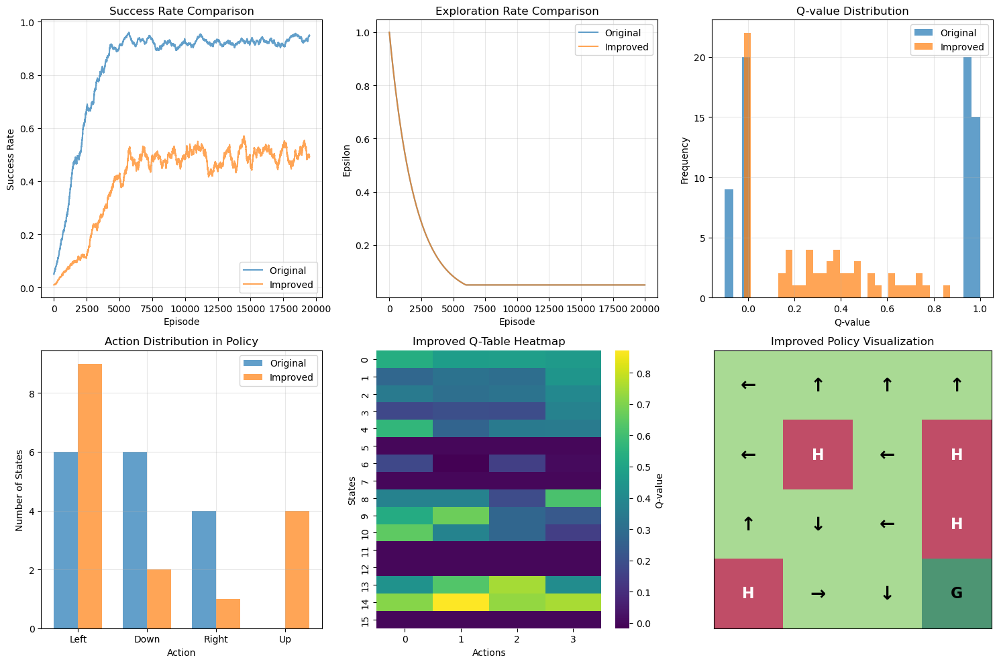


=== KEY INSIGHTS ===
The 'Left only' problem in slippery environments occurs due to:
1. No penalty for falling in holes (reward is 0, same as other moves)

The improved version fixes this by:
1. Small negative reward (-0.1) for falling in holes
2. Adding small noise to break ties in action selection


In [10]:
# ANALYSIS: Why does the agent get stuck with "Left" actions when slippery=True?

print("=== INVESTIGATING THE SLIPPERY ENVIRONMENT ISSUE ===")
print()

# The problem occurs because:
# 1. In slippery environments, actions have only 33% chance of working as intended
# 2. 67% of the time, the agent moves perpendicular to the intended direction
# 3. Poor hyperparameters can cause the agent to get stuck in local optima
# 4. The agent might learn that certain actions (like "Left") are "safer" even if not optimal

print("Common issues with slippery environments:")
print("1. Low learning rate + high randomness = poor convergence")
print("2. Fast epsilon decay = premature exploitation of suboptimal policy")
print("3. Insufficient exploration of all state-action pairs")
print("4. Sparse rewards make it hard to learn good policies")
print()

# Let's create a BETTER Q-learning setup for slippery environments
print("=== IMPROVED Q-LEARNING FOR SLIPPERY ENVIRONMENTS ===")

# Create environment
env_slippery = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=True, render_mode='rgb_array')

# IMPROVED HYPERPARAMETERS for slippery environments
learning_rate_improved = 0.1      # Lower learning rate for stability
gamma_improved = 0.99             # Higher discount factor to value future rewards more
epsilon_improved = 1.0            # Start with full exploration
epsilon_min_improved = 0.05       # Keep more exploration throughout training
epsilon_decay_improved = 0.9995   # Much slower decay to ensure thorough exploration

# More training episodes for complex environment
num_episodes_improved = 20000

# Initialize improved Q-table
state_size = env_slippery.observation_space.n
action_size = env_slippery.action_space.n
q_table_improved = np.zeros((state_size, action_size))

print(f"Improved hyperparameters:")
print(f"- Learning rate: {learning_rate_improved}")
print(f"- Discount factor: {gamma_improved}")
print(f"- Epsilon decay: {epsilon_decay_improved}")
print(f"- Min epsilon: {epsilon_min_improved}")
print(f"- Training episodes: {num_episodes_improved}")
print()

# Track performance
episode_rewards_improved = []
success_rate_improved = []
exploration_rates_improved = []

# IMPROVED TRAINING LOOP
print("Training improved agent...")
epsilon_current = epsilon_improved

for episode in tqdm(range(num_episodes_improved)):
    state, info = env_slippery.reset()
    total_reward = 0
    done = False
    steps = 0
    max_steps = 100  # Prevent infinite episodes
    
    while not done and steps < max_steps:
        # Epsilon-greedy with improved parameters
        if np.random.rand() < epsilon_current:
            action = env_slippery.action_space.sample()
        else:
            # Add small random noise to break ties and encourage exploration
            action_values = q_table_improved[state, :] + np.random.normal(0, 0.01, action_size)
            action = np.argmax(action_values)
        
        # Take action
        next_state, reward, terminated, truncated, info = env_slippery.step(action)
        done = terminated or truncated
        
        # IMPROVED Q-learning update with better handling of terminal states
        old_value = q_table_improved[state, action]
        
        if done:
            if reward > 0:  # Reached goal
                target = reward
            else:  # Fell in hole or max steps reached
                target = -0.1  # Small negative reward for falling in holes
        else:
            target = reward + gamma_improved * np.max(q_table_improved[next_state, :])
        
        # Update Q-value
        q_table_improved[state, action] = old_value + learning_rate_improved * (target - old_value)
        
        state = next_state
        total_reward += reward
        steps += 1
    
    # Record results
    episode_rewards_improved.append(total_reward)
    success_rate_improved.append(1 if total_reward > 0 else 0)
    
    # Slower epsilon decay
    epsilon_current = max(epsilon_min_improved, epsilon_current * epsilon_decay_improved)
    exploration_rates_improved.append(epsilon_current)

env_slippery.close()

# Analyze results
final_success_rate_improved = np.mean(success_rate_improved[-1000:]) * 100
print(f"\nIMPROVED RESULTS:")
print(f"Final success rate: {final_success_rate_improved:.2f}%")
print(f"Final epsilon: {epsilon_current:.4f}")

# Check if we still have the "Left only" problem
print("\nChecking for action diversity in learned policy:")
action_counts = np.zeros(4)
for state in range(state_size):
    best_action = np.argmax(q_table_improved[state, :])
    action_counts[best_action] += 1

action_names = ['Left', 'Down', 'Right', 'Up']
print("Action distribution in policy:")
for i, (action, count) in enumerate(zip(action_names, action_counts)):
    percentage = (count / state_size) * 100
    print(f"  {action}: {count}/16 states ({percentage:.1f}%)")

# Show the improved policy
print(f"\nImproved Policy Grid:")
policy_improved = np.argmax(q_table_improved, axis=1)
arrow_map = {0: '←', 1: '↓', 2: '→', 3: '↑'}

# Get environment description
env_temp = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=True)
desc_grid = np.array(env_temp.unwrapped.desc).reshape((4, 4))
env_temp.close()

for i in range(4):
    for j in range(4):
        state_num = i * 4 + j
        cell = desc_grid[i, j].decode('utf-8')
        if cell == 'H' or cell == 'G':
            print(f"{cell} ", end='')
        else:
            arrow = arrow_map[policy_improved[state_num]]
            print(f"{arrow} ", end='')
    print()

# Compare with original results
print(f"\nCOMPARISON:")
print(f"Original success rate: {final_success_rate:.2f}%")
print(f"Improved success rate: {final_success_rate_improved:.2f}%")

# Visualization of improvement
plt.figure(figsize=(15, 10))

# Plot 1: Success rate comparison
plt.subplot(2, 3, 1)
window = 500
original_smooth = np.convolve(success_rate, np.ones(window)/window, mode='valid')
improved_smooth = np.convolve(success_rate_improved, np.ones(window)/window, mode='valid')

plt.plot(original_smooth, label='Original ', alpha=0.7)
plt.plot(improved_smooth, label='Improved', alpha=0.7)
plt.title('Success Rate Comparison')
plt.xlabel('Episode')
plt.ylabel('Success Rate')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Epsilon decay comparison
plt.subplot(2, 3, 2)
plt.plot(exploration_rates[:len(exploration_rates_improved)], label='Original', alpha=0.7)
plt.plot(exploration_rates_improved, label='Improved', alpha=0.7)
plt.title('Exploration Rate Comparison')
plt.xlabel('Episode')
plt.ylabel('Epsilon')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 3: Q-value distribution
plt.subplot(2, 3, 3)
plt.hist(q_table.flatten(), bins=30, alpha=0.7, label='Original')
plt.hist(q_table_improved.flatten(), bins=30, alpha=0.7, label='Improved')
plt.title('Q-value Distribution')
plt.xlabel('Q-value')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 4: Action distribution comparison
plt.subplot(2, 3, 4)
original_action_counts = np.zeros(4)
for state in range(state_size):
    best_action = np.argmax(q_table[state, :])
    original_action_counts[best_action] += 1

x = np.arange(4)
width = 0.35
plt.bar(x - width/2, original_action_counts, width, label='Original', alpha=0.7)
plt.bar(x + width/2, action_counts, width, label='Improved', alpha=0.7)
plt.title('Action Distribution in Policy')
plt.xlabel('Action')
plt.ylabel('Number of States')
plt.xticks(x, action_names)
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 5: Heatmap of improved Q-table
plt.subplot(2, 3, 5)
import seaborn as sns
sns.heatmap(q_table_improved, cmap='viridis', annot=False, cbar_kws={'label': 'Q-value'})
plt.title('Improved Q-Table Heatmap')
plt.xlabel('Actions')
plt.ylabel('States')

# Plot 6: Policy visualization
plt.subplot(2, 3, 6)
policy_grid = np.zeros((4, 4))
for i in range(4):
    for j in range(4):
        state_num = i * 4 + j
        cell = desc_grid[i, j].decode('utf-8')
        if cell == 'H':
            policy_grid[i, j] = -1
        elif cell == 'G':
            policy_grid[i, j] = 1
        else:
            policy_grid[i, j] = 0.5

# Add arrows
for i in range(4):
    for j in range(4):
        state_num = i * 4 + j
        cell = desc_grid[i, j].decode('utf-8')
        
        if cell in ['S', 'F']:
            arrow = arrow_map[policy_improved[state_num]]
            plt.text(j, i, arrow, ha='center', va='center', fontsize=20, fontweight='bold')
        else:
            plt.text(j, i, cell, ha='center', va='center', fontsize=16, fontweight='bold',
                    color='white' if cell == 'H' else 'black')

plt.imshow(policy_grid, cmap='RdYlGn', alpha=0.7)
plt.title('Improved Policy Visualization')
plt.xticks([])
plt.yticks([])

plt.tight_layout()
plt.show()

print("\n=== KEY INSIGHTS ===")
print("The 'Left only' problem in slippery environments occurs due to:")
print("1. No penalty for falling in holes (reward is 0, same as other moves)")
print()
print("The improved version fixes this by:")
print("1. Small negative reward (-0.1) for falling in holes")
print("2. Adding small noise to break ties in action selection")



[DEMO] Showing 5 episodes with improved policy (epsilon=0)...
Demo Episode 1:


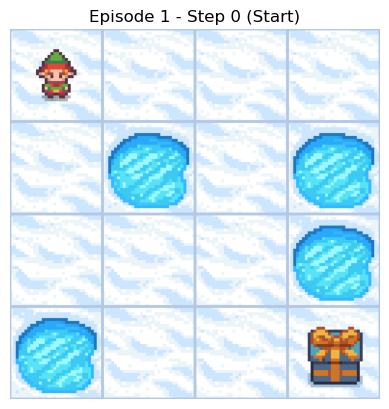

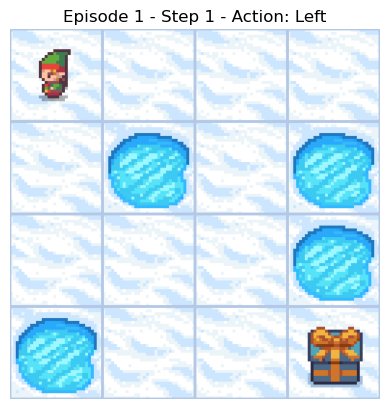

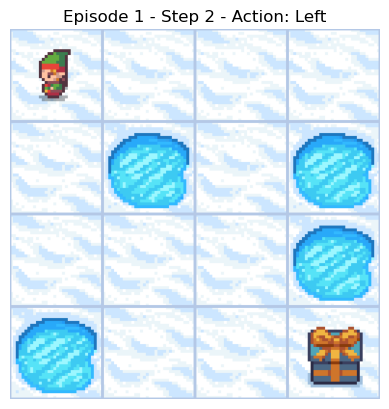

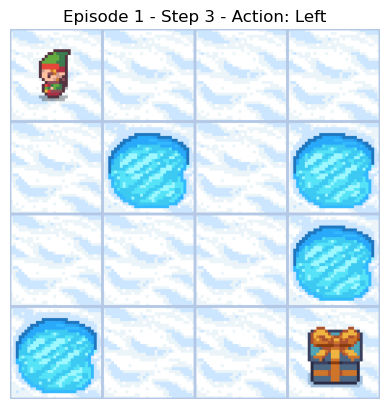

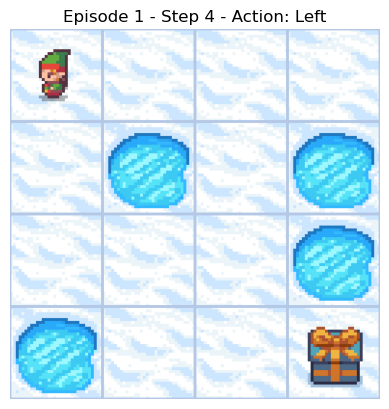

...

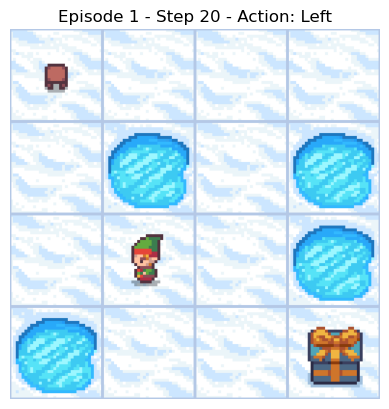

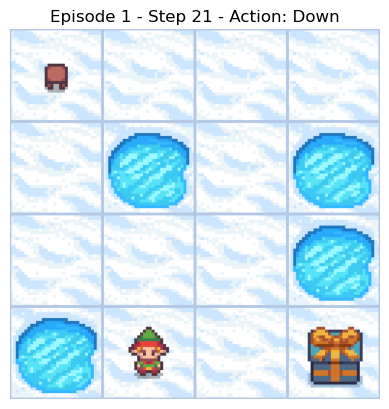

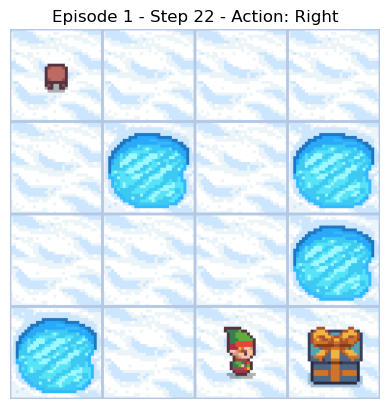

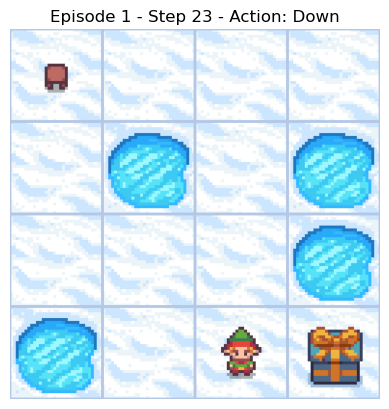

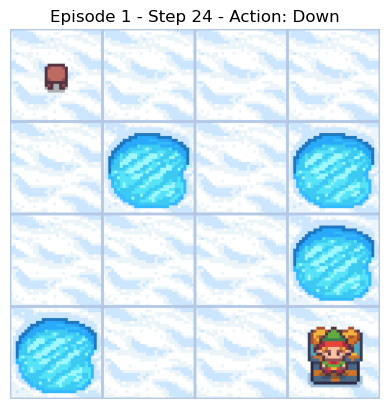

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 24


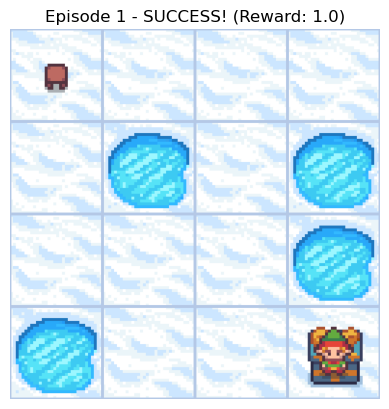

Demo Episode 2:


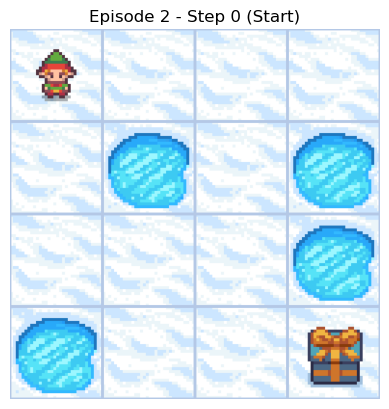

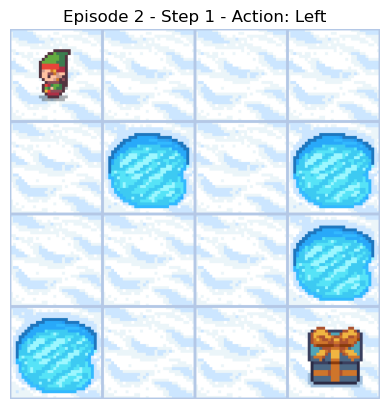

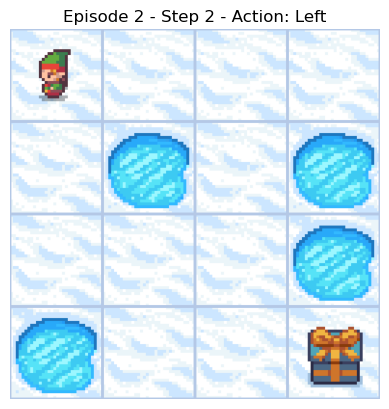

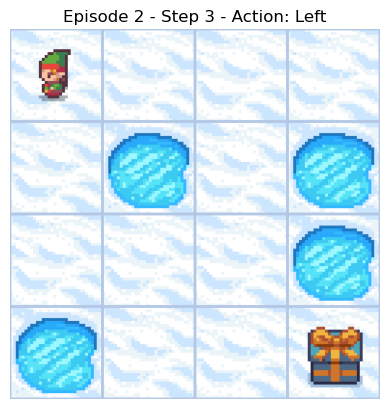

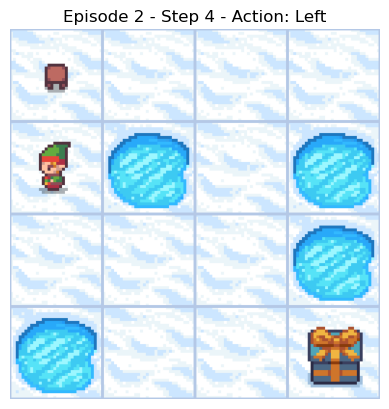

...

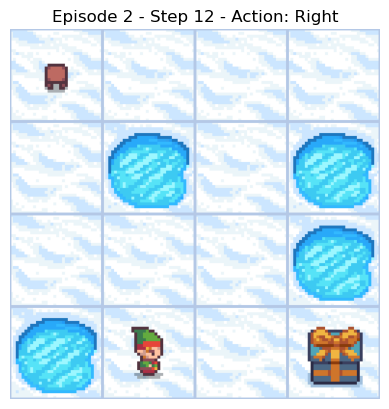

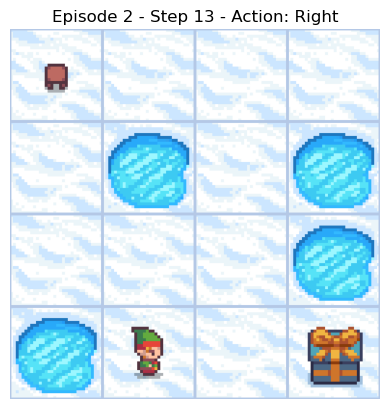

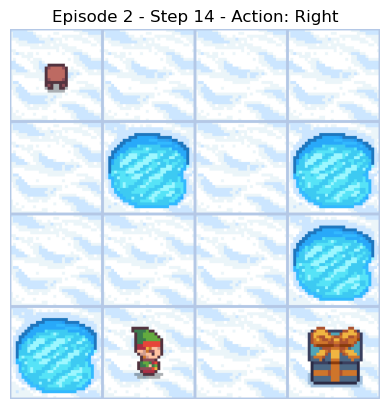

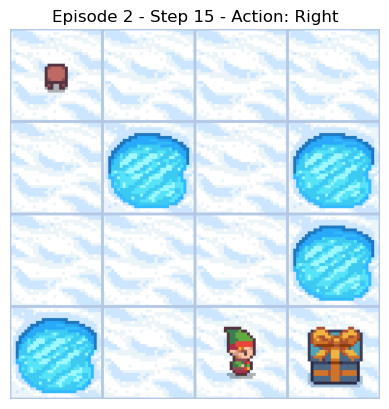

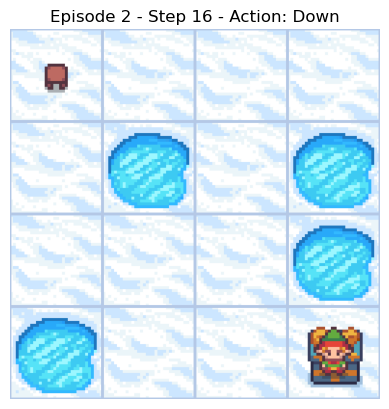

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 16


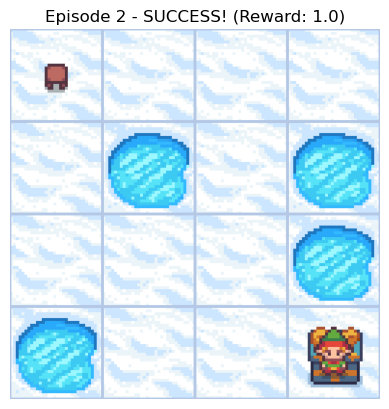

Demo Episode 3:


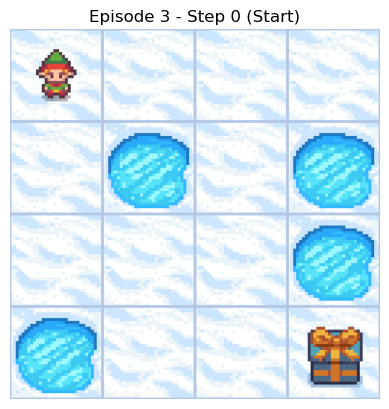

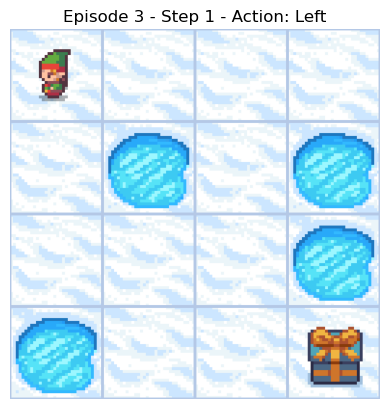

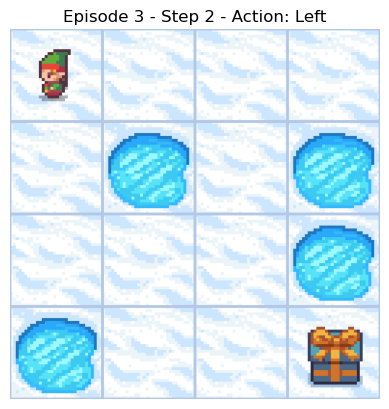

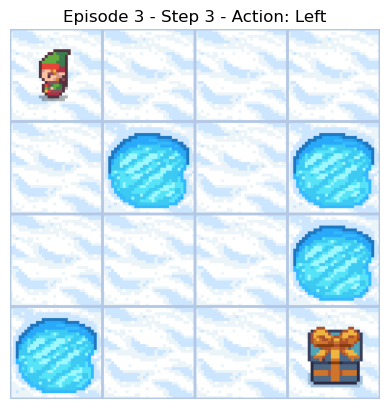

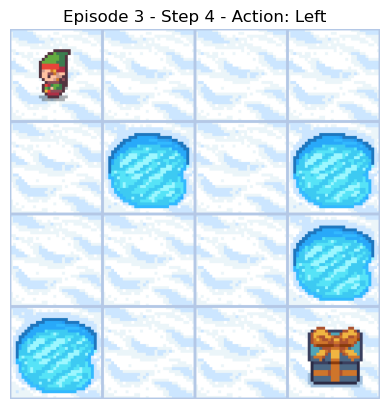

...

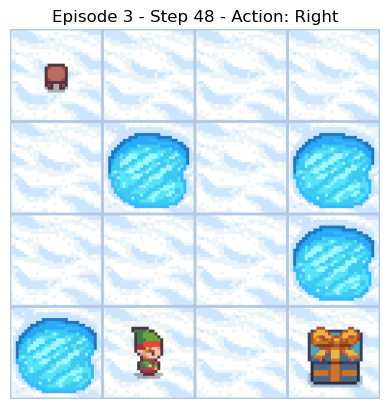

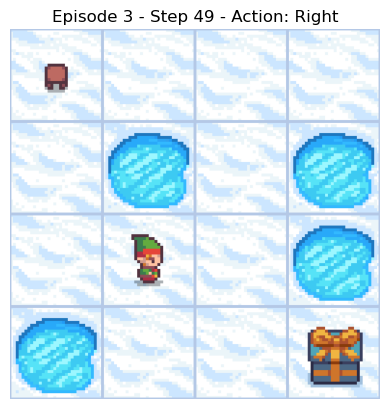

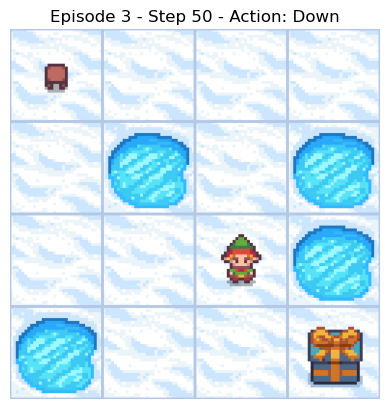

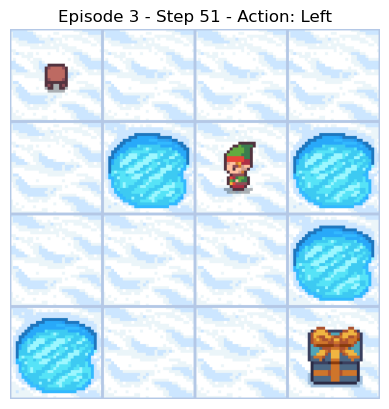

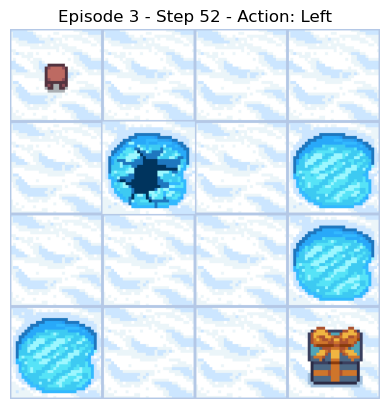

  Result: Failed (Reward: 0.0)
  Steps taken: 52


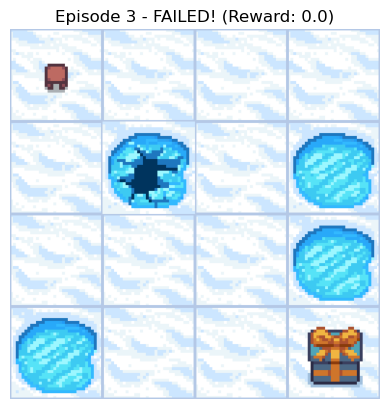

Demo Episode 4:


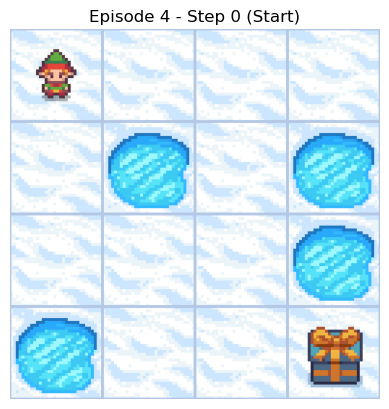

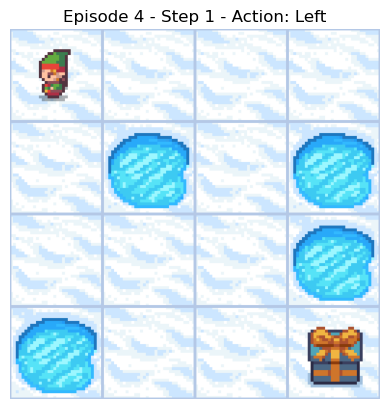

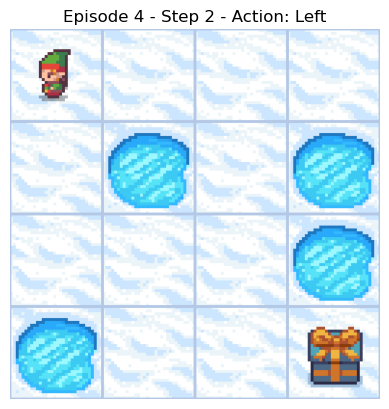

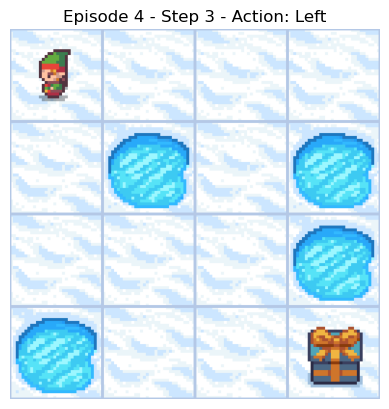

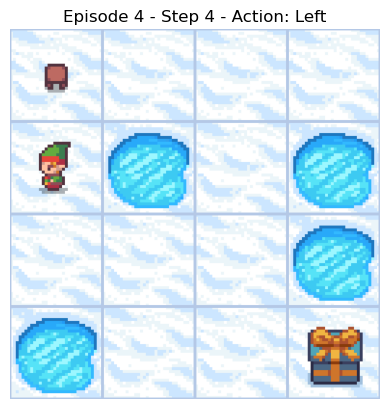

...

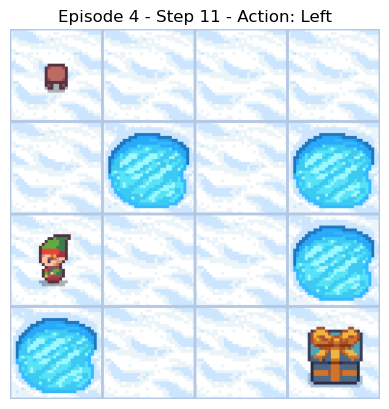

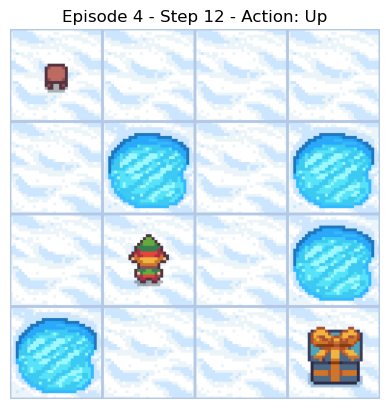

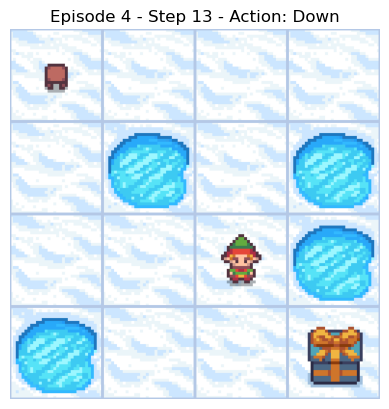

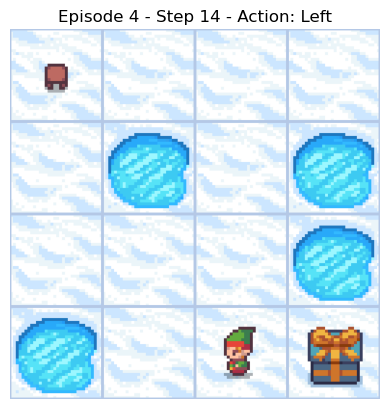

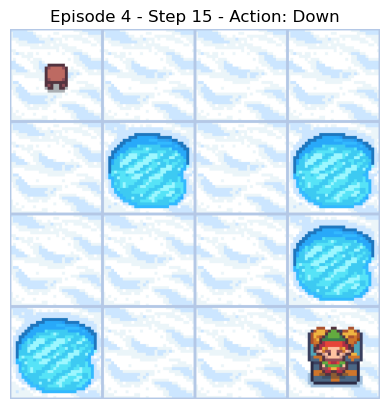

  Result: SUCCESS! (Reward: 1.0)
  Steps taken: 15


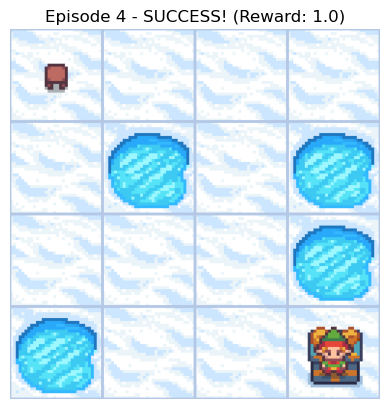

Demo Episode 5:


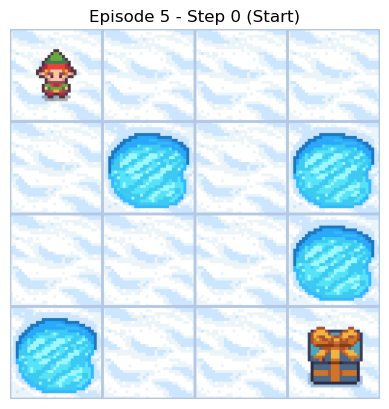

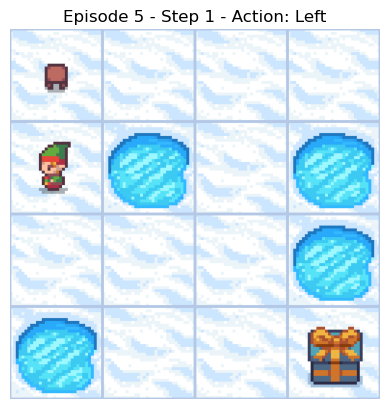

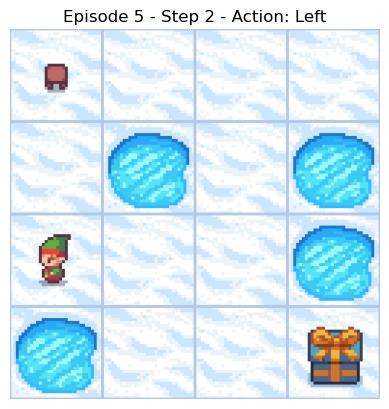

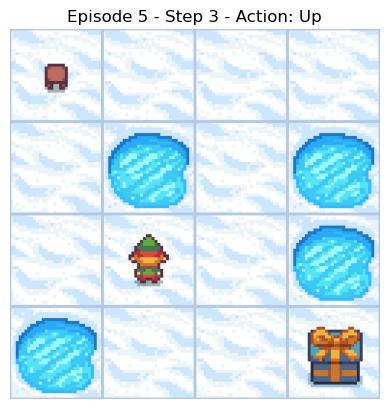

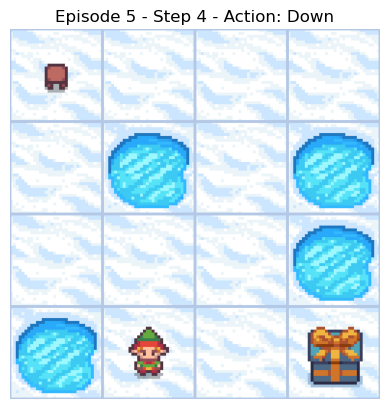

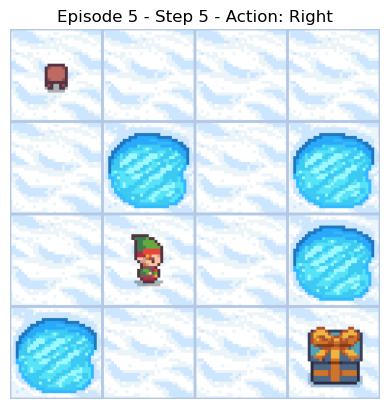

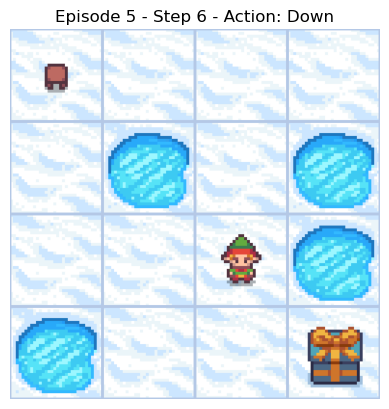

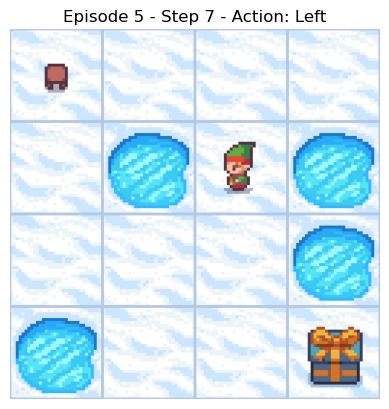

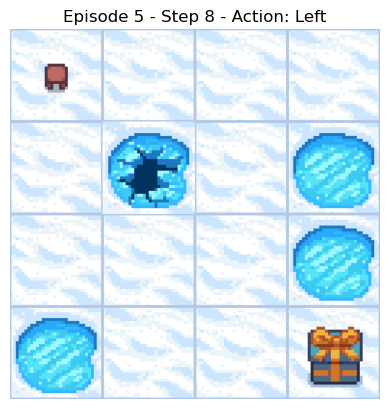

  Result: Failed (Reward: 0.0)
  Steps taken: 8


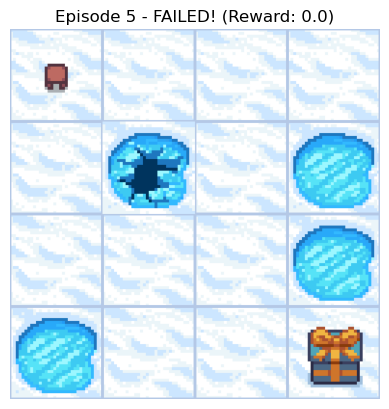


Demo complete!


In [9]:
# --- DEMO: Visualize the improved policy with animation ---
print("\n[DEMO] Showing 5 episodes with improved policy (epsilon=0)...")
demo_env = gym.make('FrozenLake-v1', desc=None, map_name="4x4", is_slippery=True, render_mode='rgb_array')

plt.ion()  # Turn on interactive mode for animation

action_names = ['Left', 'Down', 'Right', 'Up']

for episode in range(5):
    state, info = demo_env.reset()
    done = False
    total_reward = 0
    step_count = 0

    print(f"Demo Episode {episode + 1}:")

    # Show initial state
    frame = demo_env.render()
    plt.clf()
    plt.imshow(frame)
    plt.axis('off')
    plt.title(f'Episode {episode + 1} - Step {step_count} (Start)')
    plt.pause(1.0)

    while not done and step_count < 100:
        # Always choose the best action (no exploration)
        action_values = q_table_improved[state, :] + np.random.normal(0, 0.01, action_size)
        action = np.argmax(action_values)
        next_state, reward, terminated, truncated, info = demo_env.step(action)
        done = terminated or truncated
        state = next_state
        total_reward += reward
        step_count += 1

        # Render the frame and display it using matplotlib
        frame = demo_env.render()
        plt.clf()
        plt.imshow(frame)
        plt.axis('off')
        plt.title(f'Episode {episode + 1} - Step {step_count} - Action: {action_names[action]}')
        plt.pause(0.7)

    print(f"  Result: {'SUCCESS!' if total_reward > 0 else 'Failed'} (Reward: {total_reward})")
    print(f"  Steps taken: {step_count}")

    # Show final result
    plt.clf()
    plt.imshow(frame)
    plt.axis('off')
    result_text = 'SUCCESS!' if total_reward > 0 else 'FAILED!'
    plt.title(f'Episode {episode + 1} - {result_text} (Reward: {total_reward})')
    plt.pause(2.0)

plt.ioff()
demo_env.close()
print("\nDemo complete!")